# Descripción del problema
Como putno de partida en el este ejercicio tenemos que se cuenta con un dataset en el cual se ha categorizado las variables que definen el comportamiento de la enfermedad de hepatitis C (HCV).

In [ ]:
import numpy as np

import plotly.express as px #bigotes

from sklearn import datasets
#Importacion de módulo para dividir el dataset
from sklearn.model_selection import train_test_split
#Normalización de los datos
from sklearn.preprocessing import MinMaxScaler
#Importación de la regresión logistica
from sklearn.linear_model import LogisticRegression
#Importación de matriz de confusión
from sklearn.metrics import confusion_matrix
#Importación grafica de matriz de confusión
import seaborn as sns
#nuevas importaciones
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors

from matplotlib import colors

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz
#Importación knn
from sklearn.neighbors import KNeighborsClassifier

### Cargando los datos del dataset

In [ ]:
from google.colab import files
import io
archivo=files.upload()
dataframe=pd.read_csv(io.BytesIO(archivo['HCV-Egy-Data.csv']),delimiter=",")

Saving HCV-Egy-Data.csv to HCV-Egy-Data.csv


### Muestra de la información del dataset

In [ ]:
dataframe.head(17)

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric pain,...,ALT 36,ALT 48,ALT after 24 w,RNA Base,RNA 4,RNA 12,RNA EOT,RNA EF,Baseline histological Grading,Baselinehistological staging
0,56,1,35,2,1,1,1,2,2,2,...,5,5,5,655330,634536,288194,5,5,13,2
1,46,1,29,1,2,2,1,2,2,1,...,57,123,44,40620,538635,637056,336804,31085,4,2
2,57,1,33,2,2,2,2,1,1,1,...,5,5,5,571148,661346,5,735945,558829,4,4
3,49,2,33,1,2,1,2,1,2,1,...,48,77,33,1041941,449939,585688,744463,582301,10,3
4,59,1,32,1,1,2,1,2,2,2,...,94,90,30,660410,738756,3731527,338946,242861,11,1
5,58,2,22,2,2,2,1,2,2,1,...,73,114,29,1157452,1086852,5,5,5,4,4
6,42,2,26,1,1,2,2,2,2,2,...,84,80,28,325694,1034008,275095,214566,635157,12,4
7,48,2,30,1,1,2,2,1,1,2,...,96,53,39,641129,72050,787295,370605,506296,12,3
8,44,1,23,1,1,2,2,2,1,2,...,122,39,45,591441,757361,5,371090,203042,5,2
9,45,1,30,2,1,2,2,1,1,2,...,125,43,30,1151206,230488,267320,275295,555516,4,2


### Indexando las columnas para verlas completas

In [ ]:
dataframe.columns

Index(['Age ', 'Gender', 'BMI', 'Fever', 'Nausea/Vomting', 'Headache ',
       'Diarrhea ', 'Fatigue & generalized bone ache ', 'Jaundice ',
       'Epigastric pain ', 'WBC', 'RBC', 'HGB', 'Plat', 'AST 1', 'ALT 1',
       'ALT4', 'ALT 12', 'ALT 24', 'ALT 36', 'ALT 48', 'ALT after 24 w',
       'RNA Base', 'RNA 4', 'RNA 12', 'RNA EOT', 'RNA EF',
       'Baseline histological Grading', 'Baselinehistological staging'],
      dtype='object')

### Verificación de datos nulos

In [ ]:
dataframe.isnull().sum()

Age                                 0
Gender                              0
BMI                                 0
Fever                               0
Nausea/Vomting                      0
Headache                            0
Diarrhea                            0
Fatigue & generalized bone ache     0
Jaundice                            0
Epigastric pain                     0
WBC                                 0
RBC                                 0
HGB                                 0
Plat                                0
AST 1                               0
ALT 1                               0
ALT4                                0
ALT 12                              0
ALT 24                              0
ALT 36                              0
ALT 48                              0
ALT after 24 w                      0
RNA Base                            0
RNA 4                               0
RNA 12                              0
RNA EOT                             0
RNA EF      

### Descripción del dataset

In [ ]:
dataframe.describe()

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric pain,...,ALT 36,ALT 48,ALT after 24 w,RNA Base,RNA 4,RNA 12,RNA EOT,RNA EF,Baseline histological Grading,Baselinehistological staging
count,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,...,1385.000000,1385.000000,1385.000000,1.385000e+03,1.385000e+03,1.385000e+03,1385.000000,1385.000000,1385.000000,1385.000000
mean,46.319134,1.489531,28.608664,1.515523,1.502527,1.496029,1.502527,1.498917,1.501083,1.503971,...,83.117690,83.629603,33.438267,5.909512e+05,6.008956e+05,2.887536e+05,287660.336462,291378.290975,9.761733,2.536462
std,8.781506,0.500071,4.076215,0.499939,0.500174,0.500165,0.500174,0.500179,0.500179,0.500165,...,26.399031,26.223955,7.073569,3.539354e+05,3.623151e+05,2.853507e+05,264559.525070,267700.691713,4.023896,1.121392
min,32.000000,1.000000,22.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,5.000000,5.000000,5.000000,1.100000e+01,5.000000e+00,5.000000e+00,5.000000,5.000000,3.000000,1.000000
25%,39.000000,1.000000,25.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,61.000000,61.000000,28.000000,2.692530e+05,2.708930e+05,5.000000e+00,5.000000,5.000000,6.000000,2.000000
50%,46.000000,1.000000,29.000000,2.000000,2.000000,1.000000,2.000000,1.000000,2.000000,2.000000,...,84.000000,83.000000,34.000000,5.931030e+05,5.978690e+05,2.343590e+05,251376.000000,244049.000000,10.000000,3.000000
75%,54.000000,2.000000,32.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,106.000000,106.000000,40.000000,8.867910e+05,9.090930e+05,5.248190e+05,517806.000000,527864.000000,13.000000,4.000000
max,61.000000,2.000000,35.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,128.000000,128.000000,45.000000,1.201086e+06,1.201715e+06,3.731527e+06,808450.000000,810333.000000,16.000000,4.000000


### Histogramas de variables numéricas

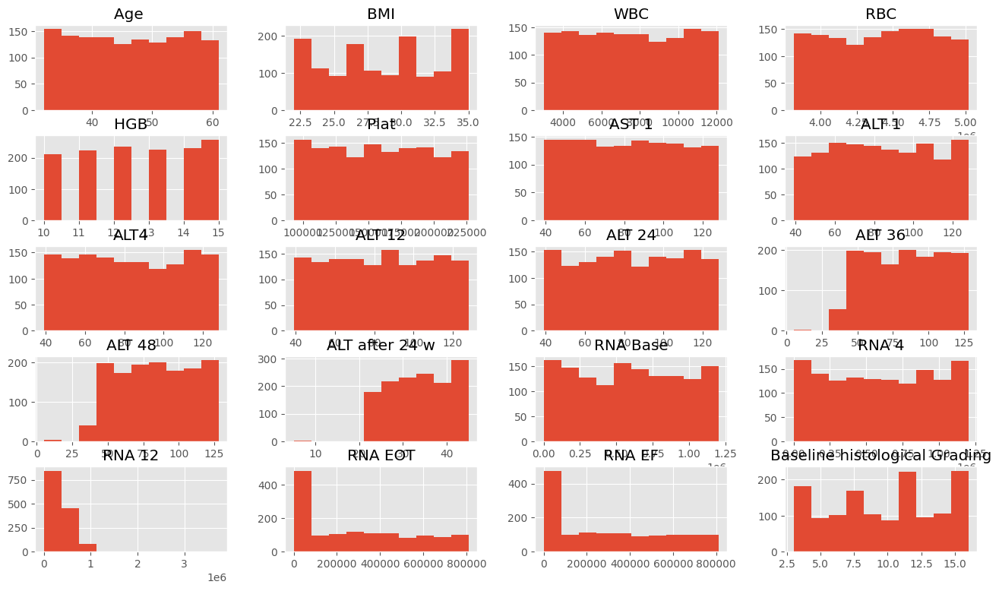

In [ ]:
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')
dataframe.drop(["Gender","Fever","Headache ", "Diarrhea ","Fatigue & generalized bone ache ","Jaundice ","Epigastric pain ","Nausea/Vomting","Baselinehistological staging"],axis=1).hist()
plt.show()

### BoxPlots de columnas numericas

In [ ]:
fig = px.box(dataframe.drop(["Gender","Fever","Headache ", "Diarrhea ","Fatigue & generalized bone ache ","Jaundice ","Epigastric pain ","Nausea/Vomting","Baselinehistological staging"],axis=1), width = 1100, height=800)
fig.show()

### Pair plots de las varibales

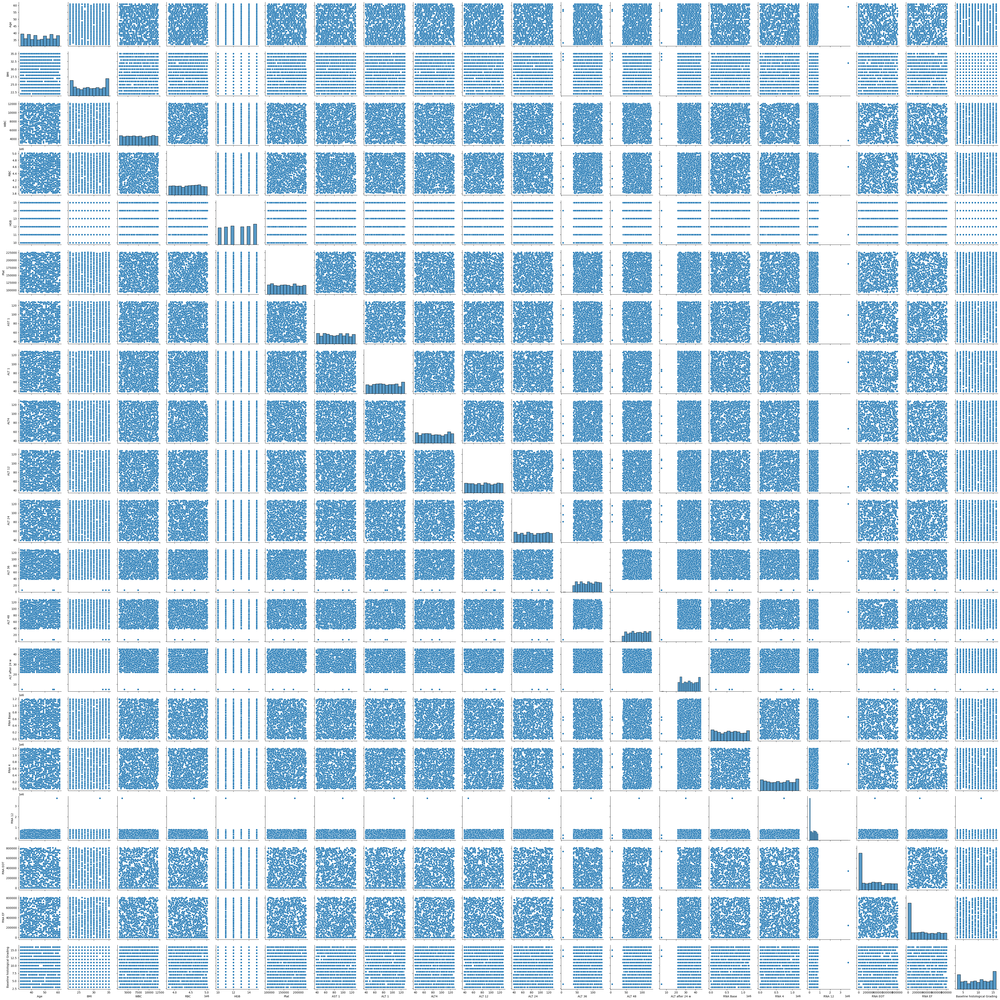

In [ ]:
#sns.pairplot(dataframe.drop(["Gender","Fever","Headache ", "Diarrhea ","Fatigue & generalized bone ache ","Jaundice ","Epigastric pain ","Nausea/Vomting","Baselinehistological staging"], axis=1))


### Matriz de correlación

In [ ]:
dataframe.corr()

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric pain,...,ALT 36,ALT 48,ALT after 24 w,RNA Base,RNA 4,RNA 12,RNA EOT,RNA EF,Baseline histological Grading,Baselinehistological staging
Age,1.000000,-0.009934,-0.025353,-0.021208,-0.025024,0.017562,0.043574,-0.007817,0.010285,-0.010817,...,-0.008721,0.027557,0.003865,0.022775,-0.012699,0.001578,-0.048702,-0.030297,-0.040705,-0.019599
Gender,-0.009934,1.000000,0.006496,0.021604,-0.036726,-0.023999,0.018161,0.045452,0.000768,-0.025111,...,0.006087,-0.020324,0.010184,-0.013371,-0.023315,-0.031379,0.035272,-0.015292,0.014559,0.011955
BMI,-0.025353,0.006496,1.000000,-0.017581,0.005801,-0.007851,-0.026094,-0.007296,-0.071379,0.008205,...,-0.029995,-0.007866,-0.021412,-0.016418,0.036864,-0.009190,-0.021428,-0.044901,-0.023045,-0.057259
Fever,-0.021208,0.021604,-0.017581,1.000000,-0.005214,0.019751,-0.019661,-0.003545,-0.005124,-0.016862,...,-0.007830,0.001238,0.000424,-0.002480,0.000727,0.019957,0.017028,-0.012406,-0.031563,-0.030975
Nausea/Vomting,-0.025024,-0.036726,0.005801,-0.005214,1.000000,0.019536,0.009361,-0.032481,0.000711,-0.051306,...,0.023808,-0.041491,0.011838,0.007975,-0.029511,-0.011250,0.005395,0.020944,-0.056782,0.054906
Headache,0.017562,-0.023999,-0.007851,0.019751,0.019536,1.000000,0.019536,-0.016624,0.007960,0.028224,...,0.017464,-0.003555,-0.003899,0.022810,-0.041613,0.011729,-0.008541,-0.007524,-0.011241,-0.001996
Diarrhea,0.043574,0.018161,-0.026094,-0.019661,0.009361,0.019536,1.000000,-0.026704,-0.016618,0.020899,...,0.008487,-0.018741,0.001831,0.018340,-0.000089,-0.012324,0.021348,0.042433,0.031891,-0.005639
Fatigue & generalized bone ache,-0.007817,0.045452,-0.007296,-0.003545,-0.032481,-0.016624,-0.026704,1.000000,0.007947,0.036842,...,0.021214,-0.008982,0.035975,-0.006124,-0.050635,0.031220,0.013778,0.006348,-0.022027,0.014563
Jaundice,0.010285,0.000768,-0.071379,-0.005124,0.000711,0.007960,-0.016618,0.007947,1.000000,-0.025289,...,0.007296,0.016253,-0.018412,0.028796,-0.008940,0.033608,0.037720,0.024757,-0.007770,0.020219
Epigastric pain,-0.010817,-0.025111,0.008205,-0.016862,-0.051306,0.028224,0.020899,0.036842,-0.025289,1.000000,...,0.032989,0.002453,0.029835,0.003261,0.005586,0.031316,0.046650,0.081423,-0.005633,-0.052110


<Axes: title={'center': 'Correlation of Features'}>

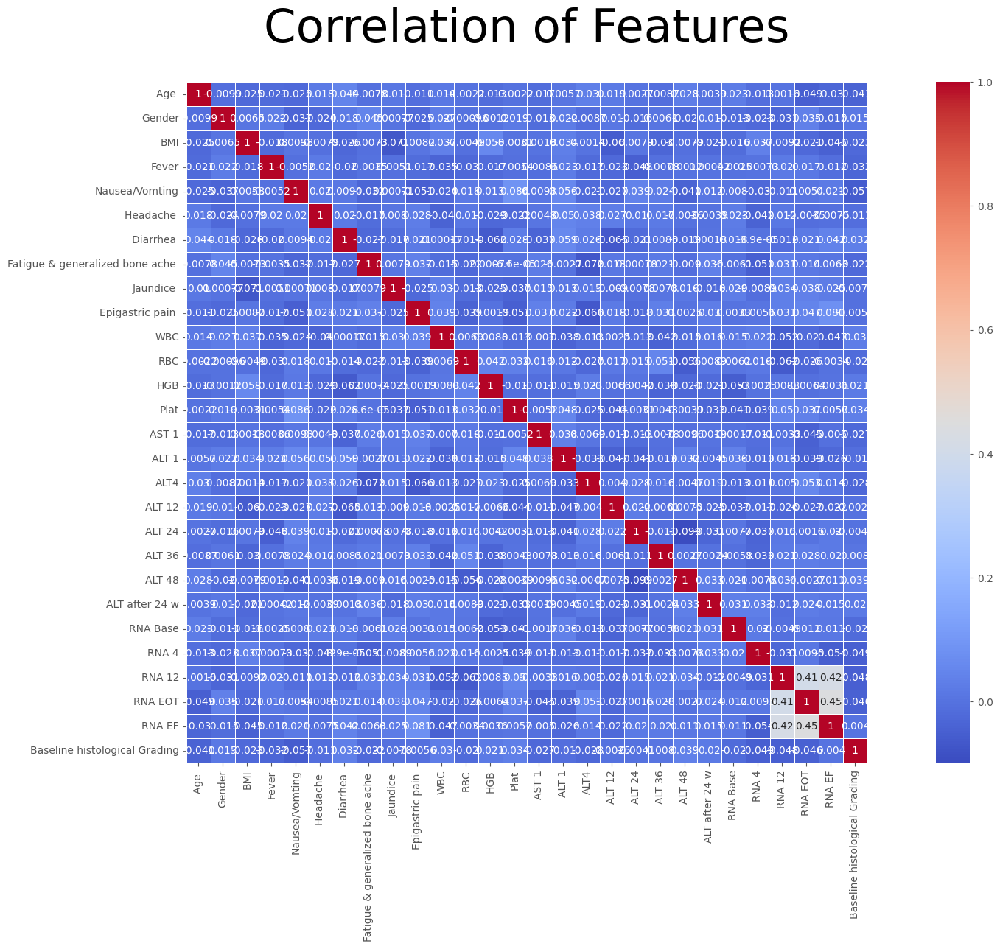

In [ ]:
colormap = plt.cm.coolwarm
plt.figure(figsize=(24,12))
plt.title('Correlation of Features', y=1.05, size=45)
sns.heatmap(dataframe.drop(['Baselinehistological staging'], axis=1).astype(float).corr(),linewidths=0.5,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True)

### Generando las copias de los dataframe
El objetivo de las copias es evitar los cambios de los dataframes

In [ ]:
dataframecopia=dataframe.replace([np.inf,-np.inf],0)
dataframecopia2=dataframe.replace([np.inf,-np.inf],0)
dataframecopia3=dataframe
dataframecopia

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric pain,...,ALT 36,ALT 48,ALT after 24 w,RNA Base,RNA 4,RNA 12,RNA EOT,RNA EF,Baseline histological Grading,Baselinehistological staging
0,56,1,35,2,1,1,1,2,2,2,...,5,5,5,655330,634536,288194,5,5,13,2
1,46,1,29,1,2,2,1,2,2,1,...,57,123,44,40620,538635,637056,336804,31085,4,2
2,57,1,33,2,2,2,2,1,1,1,...,5,5,5,571148,661346,5,735945,558829,4,4
3,49,2,33,1,2,1,2,1,2,1,...,48,77,33,1041941,449939,585688,744463,582301,10,3
4,59,1,32,1,1,2,1,2,2,2,...,94,90,30,660410,738756,3731527,338946,242861,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1380,44,1,29,1,2,2,2,1,1,1,...,63,44,45,387795,55938,5,5,5,15,4
1381,55,1,34,1,2,2,1,1,1,1,...,97,64,41,481378,152961,393339,73574,236273,10,2
1382,42,1,26,2,2,1,1,1,2,1,...,87,39,24,612664,572756,806109,343719,160457,6,2
1383,52,1,29,2,1,1,2,2,2,1,...,48,81,43,139872,76161,515730,2460,696074,15,3


## Corriendo KNN versión original

In [ ]:
y=dataframecopia['Baselinehistological staging']
#dataframecopia.drop('Baselinehistological staging', axis=1)
x=dataframecopia.drop(['Baseline histological Grading', 'Baselinehistological staging'], axis=1)
XTrain,XTest,yTrain,yTest=train_test_split(x,y,test_size=0.2,random_state=6)
modelo=KNeighborsClassifier(n_neighbors=4)
modelo.fit(XTrain,yTrain)
yPredict=modelo.predict(XTest)
print("Las predicciones son ")
print(yPredict)
print("Se esperaba ")
print(yTest)
print("Accuracy=",metrics.accuracy_score(yTest,yPredict))

Las predicciones son 
[3 3 1 1 4 2 3 4 4 1 4 4 4 2 4 2 3 1 2 1 2 2 1 1 1 4 3 3 1 1 1 4 4 1 1 4 1
 4 2 3 2 1 1 4 1 1 3 3 2 3 4 2 1 1 3 3 2 3 3 2 1 1 4 4 2 3 3 2 2 4 1 2 1 2
 3 4 3 1 4 4 3 1 3 3 4 4 1 3 3 3 4 4 4 3 1 1 4 2 4 3 1 4 2 1 4 3 2 2 1 3 2
 3 1 1 2 1 1 4 4 1 2 1 1 3 4 1 1 4 4 1 1 1 1 1 1 2 3 3 4 3 2 4 2 3 2 3 1 2
 3 3 1 4 4 1 1 4 4 1 3 4 3 4 1 4 4 4 1 3 2 4 3 1 4 4 1 4 1 2 2 3 3 3 2 1 2
 4 1 1 4 1 4 2 4 3 1 2 4 3 1 3 1 2 3 4 4 4 1 1 1 3 3 3 3 1 4 4 1 3 3 2 1 3
 3 4 4 4 4 1 4 2 1 1 3 2 1 3 2 1 2 4 4 3 2 2 4 2 3 1 3 3 1 3 3 4 1 2 3 3 1
 2 4 1 1 4 4 3 2 3 1 1 1 1 1 1 1 1 2]
Se esperaba 
584     4
268     2
264     4
732     4
670     4
       ..
1285    4
1034    2
85      2
1129    4
465     1
Name: Baselinehistological staging, Length: 277, dtype: int64
Accuracy= 0.27075812274368233


### Matriz de confusión

[[29 18 16 16]
 [17  7 17 15]
 [23 10 17 18]
 [20 14 18 22]]
Especificidad F1: 0.3670886075949367
Especificidad F2 0.125
Especificidad F3: 0.25
Especificidad F4: 0.2972972972972973


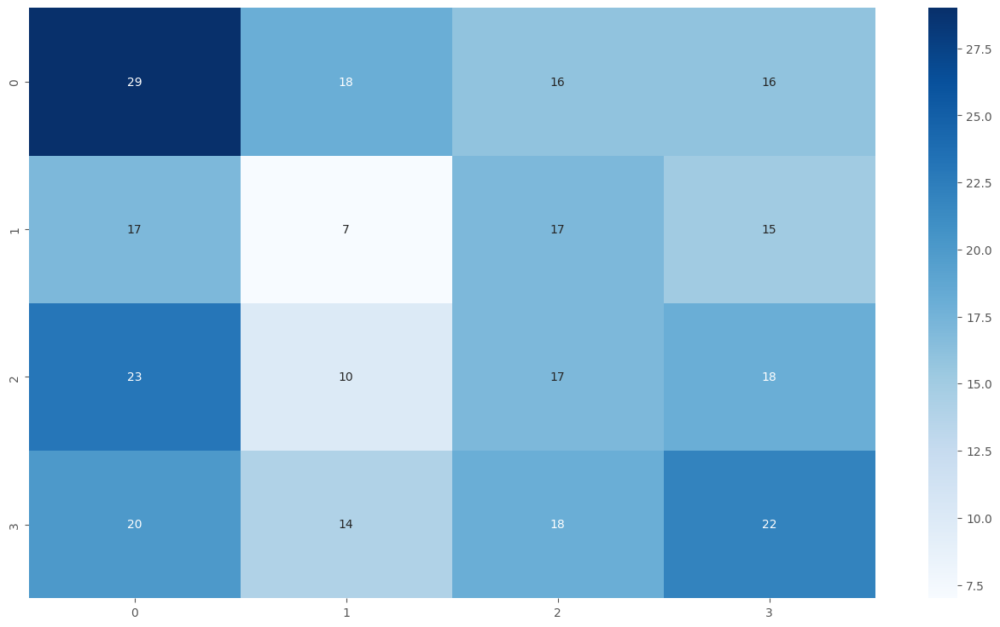

In [ ]:
matriz=confusion_matrix(yTest,yPredict)
print(matriz)
sns.heatmap(matriz,annot=True,cmap="Blues")

especificidad_1 = matriz[0,0]/(matriz[0,0]+matriz[0,:].sum()-matriz[0,0])
especificidad_2 = matriz[1,1]/(matriz[1,1]+matriz[1,:].sum()-matriz[1,1])
especificidad_3 =  matriz[2,2]/(matriz[2,2]+matriz[2,:].sum()-matriz[2,2])
especificidad_4 =  matriz[3,3]/(matriz[3,3]+matriz[3,:].sum()-matriz[3,3])

print("Especificidad F1:",especificidad_1)
print("Especificidad F2",especificidad_2)
print("Especificidad F3:",especificidad_3)
print("Especificidad F4:",especificidad_4)

### Métricas de modelo original

In [ ]:
precision_recall_fscore_support(yTest,yPredict,average=None)
etiquetas=["F1","F2","F3","F4"]
print(classification_report(yTest,yPredict,target_names=etiquetas))
print("Accuracy=",modelo.score(XTest,yTest))

              precision    recall  f1-score   support

          F1       0.33      0.37      0.35        79
          F2       0.14      0.12      0.13        56
          F3       0.25      0.25      0.25        68
          F4       0.31      0.30      0.30        74

    accuracy                           0.27       277
   macro avg       0.26      0.26      0.26       277
weighted avg       0.27      0.27      0.27       277

Accuracy= 0.27075812274368233


### Experimento de las distancias con los datos originales

In [ ]:
distancias=["","manhattan","euclidean","minkowski"]
for k in [1,2,3,4,5,7]:
  for a in range(1,len(distancias)):
    modelo=KNeighborsClassifier(n_neighbors=k,p=a)
    modelo.fit(XTrain,yTrain)
    yPredict=modelo.predict(XTest)
    print("Experimento k=",k," distancia =",distancias[a]," Accuracy=",metrics.accuracy_score(yTest,yPredict))
  print("---------------------------------------")

Experimento k= 1  distancia = manhattan  Accuracy= 0.22743682310469315
Experimento k= 1  distancia = euclidean  Accuracy= 0.23104693140794225
Experimento k= 1  distancia = minkowski  Accuracy= 0.22382671480144403
---------------------------------------
Experimento k= 2  distancia = manhattan  Accuracy= 0.23826714801444043
Experimento k= 2  distancia = euclidean  Accuracy= 0.2527075812274368
Experimento k= 2  distancia = minkowski  Accuracy= 0.22743682310469315
---------------------------------------
Experimento k= 3  distancia = manhattan  Accuracy= 0.2527075812274368
Experimento k= 3  distancia = euclidean  Accuracy= 0.26714801444043323
Experimento k= 3  distancia = minkowski  Accuracy= 0.23104693140794225
---------------------------------------
Experimento k= 4  distancia = manhattan  Accuracy= 0.2815884476534296
Experimento k= 4  distancia = euclidean  Accuracy= 0.27075812274368233
Experimento k= 4  distancia = minkowski  Accuracy= 0.2743682310469314
--------------------------------

## Corriendo el modelo eliminado las variables que no tienen en cuenta en la OMS

In [ ]:
  dataframecopia2.dropna()
y=dataframecopia2['Baselinehistological staging']
#dataframecopia2.drop(['Age ','BMI','HGB','Gender','AST 1','ALT 1','ALT4','ALT 12','ALT 24','ALT 48','RNA Base','RNA 4','RNA 12','RNA EOT','RNA EF','Baselinehistological staging'],axis=1)
#x=dataframecopia2
x=dataframecopia2.drop(['Age ','BMI','WBC', 'RBC','HGB','Plat','AST 1','ALT 1','ALT4','ALT 12','ALT 24','ALT 36','ALT 48','ALT after 24 w','RNA Base','RNA 4','RNA 12','RNA EOT','RNA EF','Baselinehistological staging','Baseline histological Grading'],axis=1)
XTrain,XTest,yTrain,yTest=train_test_split(x,y,test_size=0.2,random_state=6)
modelo=KNeighborsClassifier(n_neighbors=4)
modelo.fit(XTrain,yTrain)
yPredict=modelo.predict(XTest)
print("Las predicciones son ")
print(yPredict)
print("Se esperaba ")
print(yTest)
print("Accuracy=",metrics.accuracy_score(yTest,yPredict))



Las predicciones son 
[3 1 4 4 3 2 2 2 1 1 3 3 1 2 4 1 4 3 2 1 1 3 3 2 1 1 4 2 2 2 2 2 4 1 2 1 1
 2 1 2 3 1 3 3 3 2 1 3 1 1 1 2 1 2 4 3 4 3 2 2 1 1 2 2 1 1 2 3 4 1 4 1 4 3
 4 4 4 2 3 1 1 2 4 3 1 3 2 1 1 2 2 2 1 1 3 4 4 2 1 1 4 1 4 1 1 1 4 1 3 1 1
 3 1 3 2 3 2 4 4 4 2 4 3 1 1 3 1 3 4 3 1 1 2 4 1 2 1 2 4 3 4 1 4 1 2 1 1 3
 1 2 2 1 3 1 2 4 1 2 2 1 1 3 2 3 1 4 1 1 2 2 2 2 1 1 1 2 3 1 2 3 4 1 2 4 2
 2 4 2 1 4 4 2 1 3 3 3 3 4 1 1 3 3 1 2 4 4 3 2 1 1 2 1 1 2 1 1 1 2 3 4 1 2
 3 3 1 2 1 1 4 2 1 1 1 1 3 1 1 2 1 2 4 3 1 4 3 4 4 3 2 2 2 4 4 1 1 2 4 1 2
 1 2 4 2 2 1 3 1 3 4 1 3 2 4 1 1 4 3]
Se esperaba 
584     4
268     2
264     4
732     4
670     4
       ..
1285    4
1034    2
85      2
1129    4
465     1
Name: Baselinehistological staging, Length: 277, dtype: int64
Accuracy= 0.2527075812274368


### Matriz de confusión con solo las variables de la OMS

[[27 22 17 13]
 [21 14 10 11]
 [30 11 14 13]
 [22 25 12 15]]
Especificidad F1: 0.34177215189873417
Especificidad F2 0.25
Especificidad F3: 0.20588235294117646
Especificidad F4: 0.20270270270270271


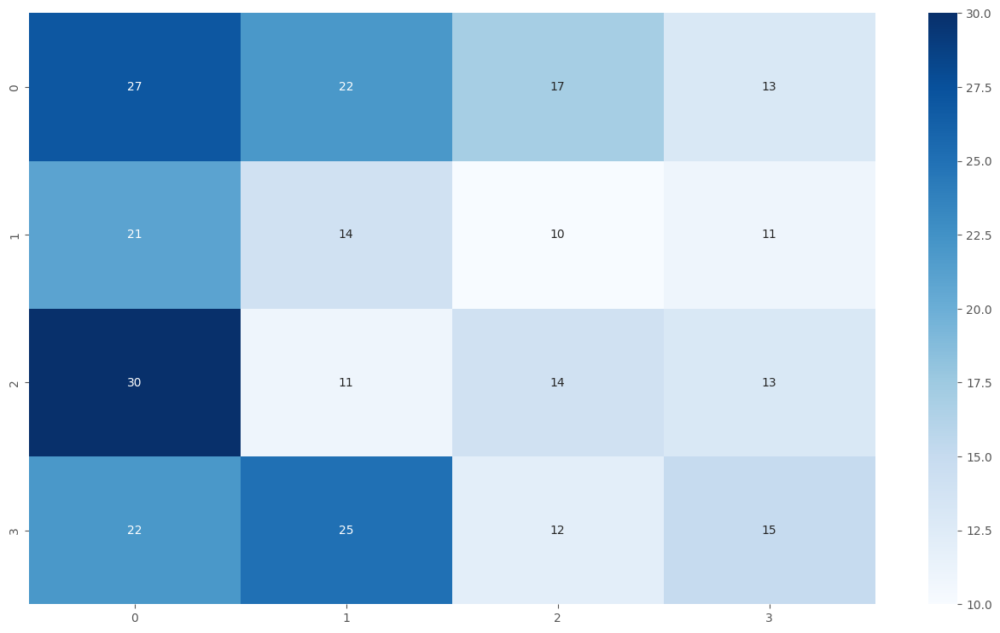

In [ ]:
matriz=confusion_matrix(yTest,yPredict)
print(matriz)
sns.heatmap(matriz,annot=True,cmap="Blues")

especificidad_1 = matriz[0,0]/(matriz[0,0]+matriz[0,:].sum()-matriz[0,0])
especificidad_2 = matriz[1,1]/(matriz[1,1]+matriz[1,:].sum()-matriz[1,1])
especificidad_3 =  matriz[2,2]/(matriz[2,2]+matriz[2,:].sum()-matriz[2,2])
especificidad_4 =  matriz[3,3]/(matriz[3,3]+matriz[3,:].sum()-matriz[3,3])

print("Especificidad F1:",especificidad_1)
print("Especificidad F2",especificidad_2)
print("Especificidad F3:",especificidad_3)
print("Especificidad F4:",especificidad_4)

### Métricas del modelos solo con los campos de la OMS

In [ ]:
precision_recall_fscore_support(yTest,yPredict,average=None)
etiquetas=["F1","F2","F3","F4"]
print(classification_report(yTest,yPredict,target_names=etiquetas))
print("Accuracy=",modelo.score(XTest,yTest))

              precision    recall  f1-score   support

          F1       0.27      0.34      0.30        79
          F2       0.19      0.25      0.22        56
          F3       0.26      0.21      0.23        68
          F4       0.29      0.20      0.24        74

    accuracy                           0.25       277
   macro avg       0.25      0.25      0.25       277
weighted avg       0.26      0.25      0.25       277

Accuracy= 0.2527075812274368


### Métricas con el dataset modificado

In [ ]:
distancias=["","manhattan","euclidean","minkowski"]
for k in [1,2,3,4,5,7]:
  for a in range(1,len(distancias)):
    modelo=KNeighborsClassifier(n_neighbors=k,p=a)
    modelo.fit(XTrain,yTrain)
    yPredict=modelo.predict(XTest)
    print("Experimento k=",k," distancia =",distancias[a]," Accuracy=",metrics.accuracy_score(yTest,yPredict))
  print("---------------------------------------")

Experimento k= 1  distancia = manhattan  Accuracy= 0.24548736462093862
Experimento k= 1  distancia = euclidean  Accuracy= 0.24548736462093862
Experimento k= 1  distancia = minkowski  Accuracy= 0.24548736462093862
---------------------------------------
Experimento k= 2  distancia = manhattan  Accuracy= 0.26714801444043323
Experimento k= 2  distancia = euclidean  Accuracy= 0.26714801444043323
Experimento k= 2  distancia = minkowski  Accuracy= 0.26714801444043323
---------------------------------------
Experimento k= 3  distancia = manhattan  Accuracy= 0.2779783393501805
Experimento k= 3  distancia = euclidean  Accuracy= 0.2779783393501805
Experimento k= 3  distancia = minkowski  Accuracy= 0.2779783393501805
---------------------------------------
Experimento k= 4  distancia = manhattan  Accuracy= 0.2527075812274368
Experimento k= 4  distancia = euclidean  Accuracy= 0.2527075812274368
Experimento k= 4  distancia = minkowski  Accuracy= 0.2527075812274368
----------------------------------

## KNN con SMOTE y las varibles originales

In [ ]:
from imblearn.over_sampling import SMOTE
y=dataframecopia3['Baselinehistological staging']
#dataframecopia3.drop('Baselinehistological staging', axis=1)
x=dataframecopia3.drop([ 'Baselinehistological staging'],axis=1)

num_rep=4
datasets_equilibrados=[]
for i in range(2**num_rep):
  smote = SMOTE(random_state=i)
  x_resampled, y_resampled= smote.fit_resample(x,y)
  datasets_equilibrados.append({'x':x_resampled , 'y':y_resampled})

x_combinados= pd.concat([data['x'] for data in datasets_equilibrados], axis=0)
y_combinados= pd.concat([data['y'] for data in datasets_equilibrados], axis=0)
XTrain,XTest,yTrain,yTest=train_test_split(x_combinados,y_combinados,test_size=0.2,random_state=6)

modelo=KNeighborsClassifier(n_neighbors=4)
modelo.fit(XTrain,yTrain)
yPredict=modelo.predict(XTrain)
print("Train Accuracy ",metrics.accuracy_score(yTrain,yPredict))

yPredict=modelo.predict(XTest)
print("Test Accuracy ",metrics.accuracy_score(yTest,yPredict))

Train Accuracy  0.9971943455271393
Test Accuracy  0.9958998705222271


### Matriz de confusión con KNN y SMOTE

[[1119    3    4    0]
 [   5 1162    4    2]
 [   1    0 1169    0]
 [   0    0    0 1165]]
Especificidad F1: 0.9937833037300178
Especificidad F2 0.9906223358908781
Especificidad F3: 0.9991452991452991
Especificidad F4: 1.0


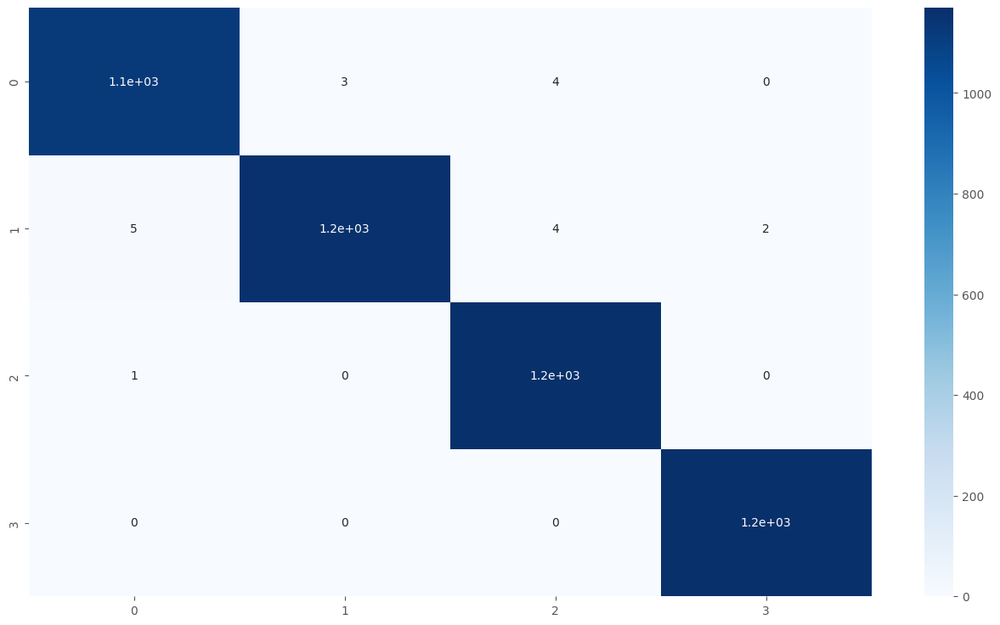

In [ ]:
matriz=confusion_matrix(yTest,yPredict)
print(matriz)
sns.heatmap(matriz,annot=True,cmap="Blues")

especificidad_1 = matriz[0,0]/(matriz[0,0]+matriz[0,:].sum()-matriz[0,0])
especificidad_2 = matriz[1,1]/(matriz[1,1]+matriz[1,:].sum()-matriz[1,1])
especificidad_3 =  matriz[2,2]/(matriz[2,2]+matriz[2,:].sum()-matriz[2,2])
especificidad_4 =  matriz[3,3]/(matriz[3,3]+matriz[3,:].sum()-matriz[3,3])

print("Especificidad F1:",especificidad_1)
print("Especificidad F2",especificidad_2)
print("Especificidad F3:",especificidad_3)
print("Especificidad F4:",especificidad_4)

### Metricas de KNN y SMOTE

In [ ]:
precision_recall_fscore_support(yTest,yPredict,average=None)
etiquetas=["F1","F2","F3","F4"]
print(classification_report(yTest,yPredict,target_names=etiquetas))
print("Accuracy=",modelo.score(XTest,yTest))

              precision    recall  f1-score   support

          F1       0.99      0.99      0.99      1126
          F2       1.00      0.99      0.99      1173
          F3       0.99      1.00      1.00      1170
          F4       1.00      1.00      1.00      1165

    accuracy                           1.00      4634
   macro avg       1.00      1.00      1.00      4634
weighted avg       1.00      1.00      1.00      4634

Accuracy= 0.9958998705222271


### Experimento con KNN y SMOTE

In [ ]:
distancias=["","manhattan","euclidean","minkowski"]
for k in [1,2,3,4,5,7]:
  for a in range(1,len(distancias)):
    modelo=KNeighborsClassifier(n_neighbors=k,p=a)
    modelo.fit(XTrain,yTrain)
    yPredict=modelo.predict(XTest)
    print("Experimento k=",k," distancia =",distancias[a]," Accuracy=",metrics.accuracy_score(yTest,yPredict))
  print("---------------------------------------")

Experimento k= 1  distancia = manhattan  Accuracy= 0.9965472593871385
Experimento k= 1  distancia = euclidean  Accuracy= 0.9963314630988347
Experimento k= 1  distancia = minkowski  Accuracy= 0.9963314630988347
---------------------------------------
Experimento k= 2  distancia = manhattan  Accuracy= 0.9961156668105309
Experimento k= 2  distancia = euclidean  Accuracy= 0.9956840742339231
Experimento k= 2  distancia = minkowski  Accuracy= 0.9961156668105309
---------------------------------------
Experimento k= 3  distancia = manhattan  Accuracy= 0.9961156668105309
Experimento k= 3  distancia = euclidean  Accuracy= 0.9958998705222271
Experimento k= 3  distancia = minkowski  Accuracy= 0.9963314630988347
---------------------------------------
Experimento k= 4  distancia = manhattan  Accuracy= 0.9961156668105309
Experimento k= 4  distancia = euclidean  Accuracy= 0.9958998705222271
Experimento k= 4  distancia = minkowski  Accuracy= 0.9963314630988347
---------------------------------------


## KNN con SMOTE y Solo las variables de la OMS

In [ ]:
from imblearn.over_sampling import SMOTE
y=dataframecopia3['Baselinehistological staging']
x=dataframecopia3.drop(['Age ','BMI','WBC', 'RBC','HGB','Plat','AST 1','ALT 1','ALT4','ALT 12','ALT 24','ALT 36','ALT 48','ALT after 24 w','RNA Base','RNA 4','RNA 12','RNA EOT','RNA EF','Baselinehistological staging','Baseline histological Grading'],axis=1)

num_rep=4
datasets_equilibrados=[]
for i in range(2**num_rep):
  smote = SMOTE(random_state=i)
  x_resampled, y_resampled= smote.fit_resample(x,y)
  datasets_equilibrados.append({'x':x_resampled , 'y':y_resampled})

x_combinados= pd.concat([data['x'] for data in datasets_equilibrados], axis=0)
y_combinados= pd.concat([data['y'] for data in datasets_equilibrados], axis=0)
XTrain,XTest,yTrain,yTest=train_test_split(x_combinados,y_combinados,test_size=0.2,random_state=6)

modelo=KNeighborsClassifier(n_neighbors=4)
modelo.fit(XTrain,yTrain)
yPredict=modelo.predict(XTrain)
print("Train Accuracy ",metrics.accuracy_score(yTrain,yPredict))

yPredict=modelo.predict(XTest)
print("Test Accuracy ",metrics.accuracy_score(yTest,yPredict))

Train Accuracy  0.4143196287903313
Test Accuracy  0.3955545964609409


### Matriz de confusíon con SMOTE y solo las variables de la OMS

[[629 189 119 189]
 [431 463 142 137]
 [354 285 332 199]
 [336 270 150 409]]
Especificidad F1: 0.5586145648312612
Especificidad F2 0.39471440750213127
Especificidad F3: 0.28376068376068375
Especificidad F4: 0.35107296137339056


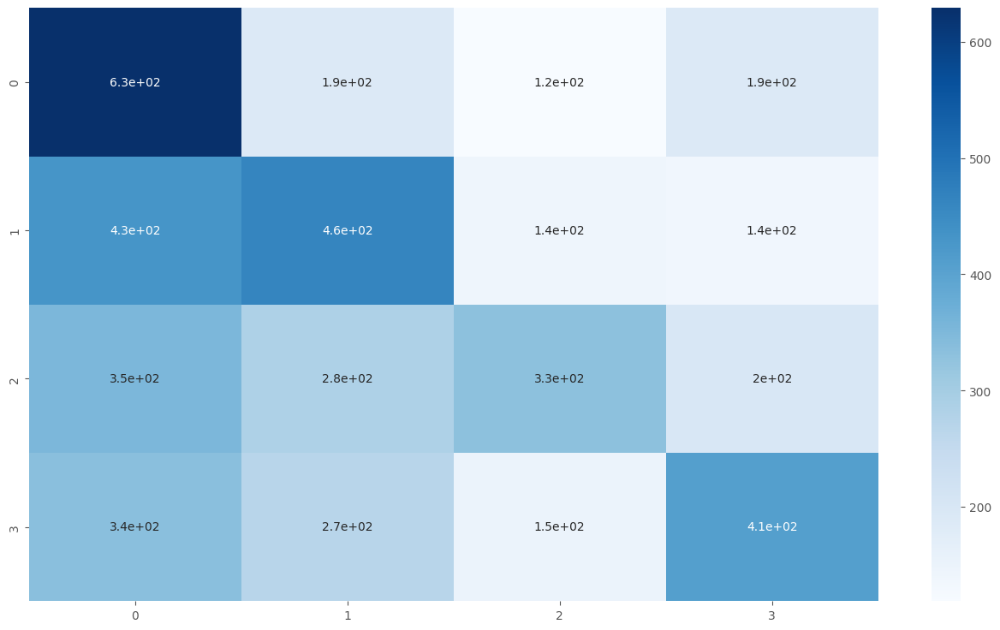

In [ ]:
matriz=confusion_matrix(yTest,yPredict)
print(matriz)
sns.heatmap(matriz,annot=True,cmap="Blues")

especificidad_1 = matriz[0,0]/(matriz[0,0]+matriz[0,:].sum()-matriz[0,0])
especificidad_2 = matriz[1,1]/(matriz[1,1]+matriz[1,:].sum()-matriz[1,1])
especificidad_3 =  matriz[2,2]/(matriz[2,2]+matriz[2,:].sum()-matriz[2,2])
especificidad_4 =  matriz[3,3]/(matriz[3,3]+matriz[3,:].sum()-matriz[3,3])

print("Especificidad F1:",especificidad_1)
print("Especificidad F2",especificidad_2)
print("Especificidad F3:",especificidad_3)
print("Especificidad F4:",especificidad_4)

### Métricas de KNN con SMOTE y solo las variables de la OMS

In [ ]:
precision_recall_fscore_support(yTest,yPredict,average=None)
etiquetas=["F1","F2","F3","F4"]
print(classification_report(yTest,yPredict,target_names=etiquetas))
print("Accuracy=",modelo.score(XTest,yTest))

              precision    recall  f1-score   support

          F1       0.36      0.56      0.44      1126
          F2       0.38      0.39      0.39      1173
          F3       0.45      0.28      0.35      1170
          F4       0.44      0.35      0.39      1165

    accuracy                           0.40      4634
   macro avg       0.41      0.40      0.39      4634
weighted avg       0.41      0.40      0.39      4634

Accuracy= 0.3955545964609409


### Experimento con KNN y SMOTE aplicando solo las variables de la OMS

In [ ]:
distancias=["","manhattan","euclidean","minkowski"]
for k in [1,2,3,4,5,7]:
  for a in range(1,len(distancias)):
    modelo=KNeighborsClassifier(n_neighbors=k,p=a)
    modelo.fit(XTrain,yTrain)
    yPredict=modelo.predict(XTest)
    print("Experimento k=",k," distancia =",distancias[a]," Accuracy=",metrics.accuracy_score(yTest,yPredict))
  print("---------------------------------------")

Experimento k= 1  distancia = manhattan  Accuracy= 0.37138541217091064
Experimento k= 1  distancia = euclidean  Accuracy= 0.37138541217091064
Experimento k= 1  distancia = minkowski  Accuracy= 0.37138541217091064
---------------------------------------
Experimento k= 2  distancia = manhattan  Accuracy= 0.3690116529995684
Experimento k= 2  distancia = euclidean  Accuracy= 0.3690116529995684
Experimento k= 2  distancia = minkowski  Accuracy= 0.3690116529995684
---------------------------------------
Experimento k= 3  distancia = manhattan  Accuracy= 0.3892965041001295
Experimento k= 3  distancia = euclidean  Accuracy= 0.3892965041001295
Experimento k= 3  distancia = minkowski  Accuracy= 0.3892965041001295
---------------------------------------
Experimento k= 4  distancia = manhattan  Accuracy= 0.3955545964609409
Experimento k= 4  distancia = euclidean  Accuracy= 0.3955545964609409
Experimento k= 4  distancia = minkowski  Accuracy= 0.3955545964609409
-------------------------------------